# Test out data augmentation

In [1]:
import numpy as np
from data_loader import *
import cv2
import skimage
from skimage import filters
from skimage import morphology
import matplotlib.pyplot as plt
%matplotlib inline

C:\Users\Dan\Anaconda3\envs\mcenv\lib\site-packages\dask\config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
data, filenames = load_train_test_images(cv=0, stage=1)
        
#
#   Unpack Images from data; all in (n x c x h x w) format
#
train_x_imgs = data["train_x_images"]
train_y_imgs = data["train_y_images"]
test_x_imgs = data["test_x_images"]
test_y_imgs = data["test_y_images"]
train_filenames  = filenames["train_filenames"]
test_filenames = filenames["test_filenames"]

In [3]:
img = train_x_imgs[0]

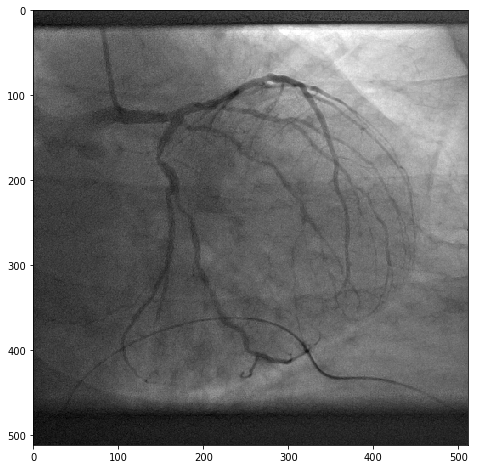

In [4]:
plt.figure(figsize=(8,8))
plt.imshow(np.squeeze(img), cmap='gray')

# Test out reshaping

In [5]:
img.shape

(1, 512, 512)

In [6]:
a = np.transpose(img,axes=(1,2,0))

In [7]:
b = cv2.resize(a, (100, 100))

In [8]:
b.shape

(100, 100)

In [9]:
np.expand_dims(b, -1).shape

(100, 100, 1)

# Argmax for binarization

In [10]:
sh = np.array([3,4,5,6,3])

In [11]:
sh.shape

(5,)

In [12]:
sh.argmax(axis=0)

3

In [13]:
sh.argmin()

0

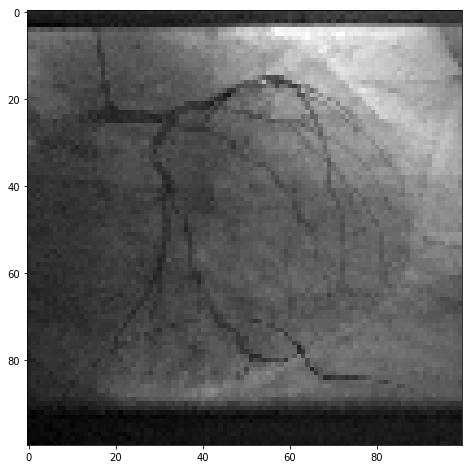

In [14]:
plt.figure(figsize=(8,8))
plt.imshow(np.squeeze(b), cmap='gray')

# OTSU binarization of original image?

In [25]:
otsu = np.zeros_like(np.squeeze(img))
otsu.shape

(512, 512)

In [26]:
otsu.max(), otsu.min(), otsu.dtype, otsu.shape

(0, 0, dtype('uint8'), (512, 512))

In [29]:
orig = np.squeeze(img)
orig.shape

(512, 512)

In [30]:
thresh = filters.threshold_otsu(orig)
otsu[orig > thresh] = 1

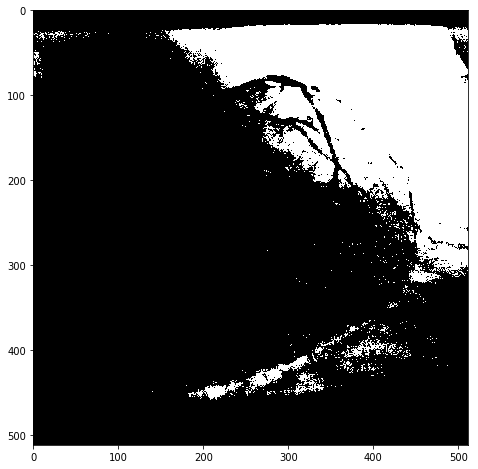

In [31]:
plt.figure(figsize=(8,8))
plt.imshow(otsu, cmap='gray')

# OTSU binarization of inverse of original image?

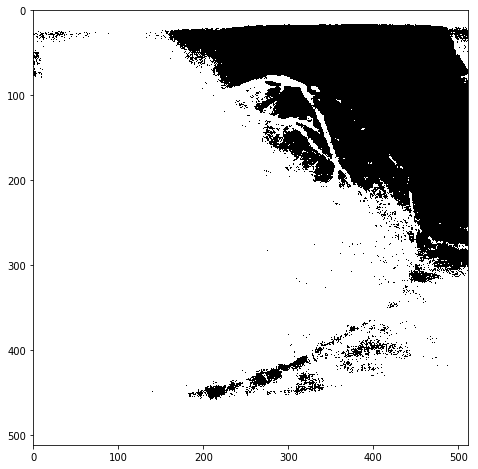

In [32]:
otsu = np.zeros_like(np.squeeze(img))
otsu.shape
orig = np.squeeze(cv2.bitwise_not(img))
thresh = filters.threshold_otsu(orig)
otsu[orig > thresh] = 1
plt.figure(figsize=(8,8))
plt.imshow(otsu, cmap='gray')

# Gaussian filter

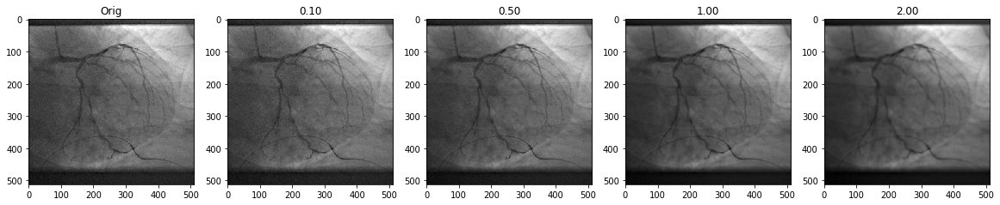

In [39]:
fig = plt.figure(figsize=(20,4))
sigmas = [0.1, 0.5, 1.0, 2.0]

ax1 = fig.add_subplot(151)
ax1.set_title("Orig")
plt.imshow(np.squeeze(img), cmap='gray')

for i in range(4):
    ax = fig.add_subplot(1, 5, i+2)
    ax.set_title("%.02f"%sigmas[i])
    plt.imshow(filters.gaussian(np.squeeze(img), sigma=sigmas[i]), cmap='gray')

# Different edge maps

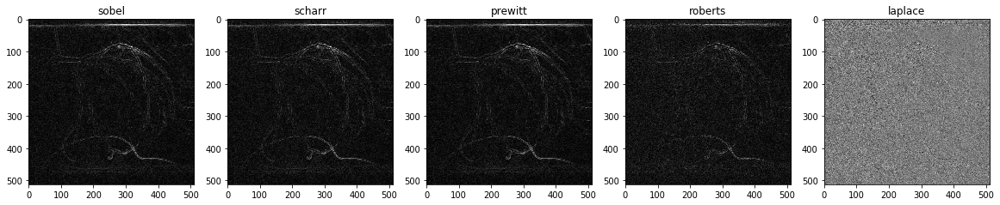

In [42]:
maps = ['sobel', 'scharr', 'prewitt', 'roberts', 'laplace']

fig = plt.figure(figsize=(20,4))

for i,m in enumerate(maps):
    ax = fig.add_subplot(1, 5, i+1)
    ax.set_title(m)
    f = getattr(filters, m)
    plt.imshow(f(np.squeeze(img)), cmap='gray')

# Black and white tophat with selem of square(5) and square(50)
- The neighborhood expressed as a square 2-D array of 1's and 0's.

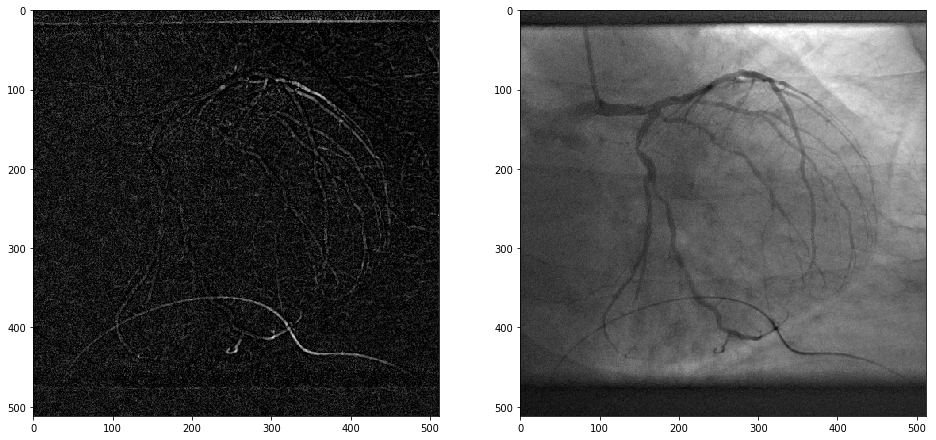

In [15]:
bottom_hat = morphology.black_tophat(np.squeeze(img), selem=morphology.square(5))
fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
plt.imshow(np.squeeze(bottom_hat), cmap='gray')
fig.add_subplot(122)
plt.imshow(np.squeeze(img), cmap='gray')

# Bitwise not of bottom hat

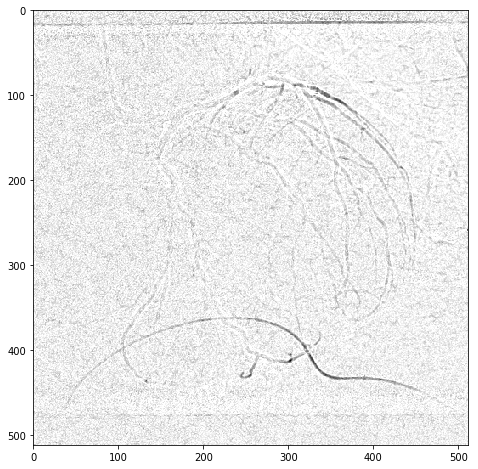

In [16]:
plt.figure(figsize=(8,8))
plt.imshow(np.squeeze(cv2.bitwise_not(bottom_hat)), cmap='gray')

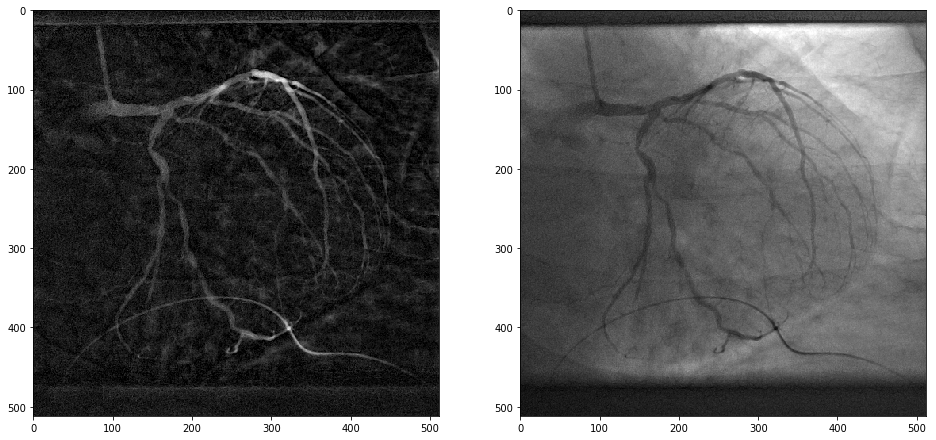

In [17]:
bottom_hat = morphology.black_tophat(np.squeeze(img), selem=morphology.square(25))
fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
plt.imshow(np.squeeze(bottom_hat), cmap='gray')
fig.add_subplot(122)
plt.imshow(np.squeeze(img), cmap='gray')

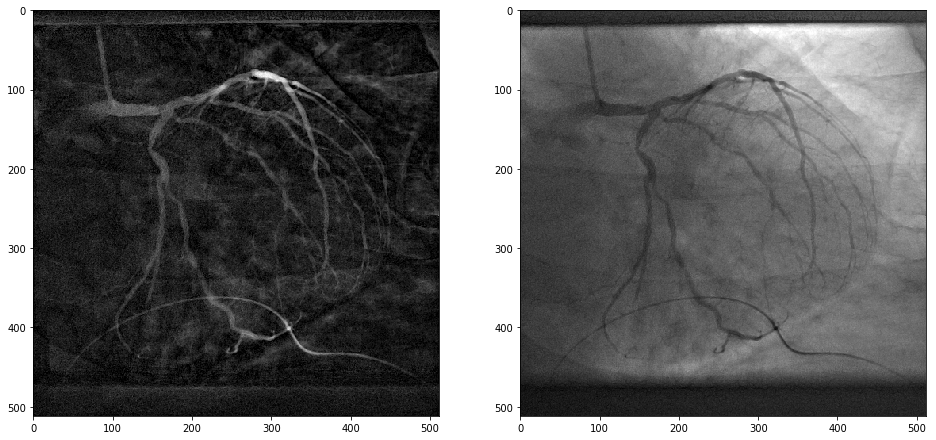

In [18]:
bottom_hat = morphology.black_tophat(np.squeeze(img), selem=morphology.square(50))
fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
plt.imshow(np.squeeze(bottom_hat), cmap='gray')
fig.add_subplot(122)
plt.imshow(np.squeeze(img), cmap='gray')

# Bitwise not of top hat

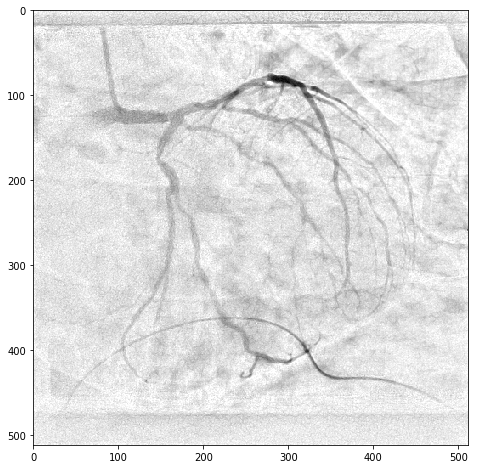

In [19]:
plt.figure(figsize=(8,8))
plt.imshow(np.squeeze(cv2.bitwise_not(bottom_hat)), cmap='gray')

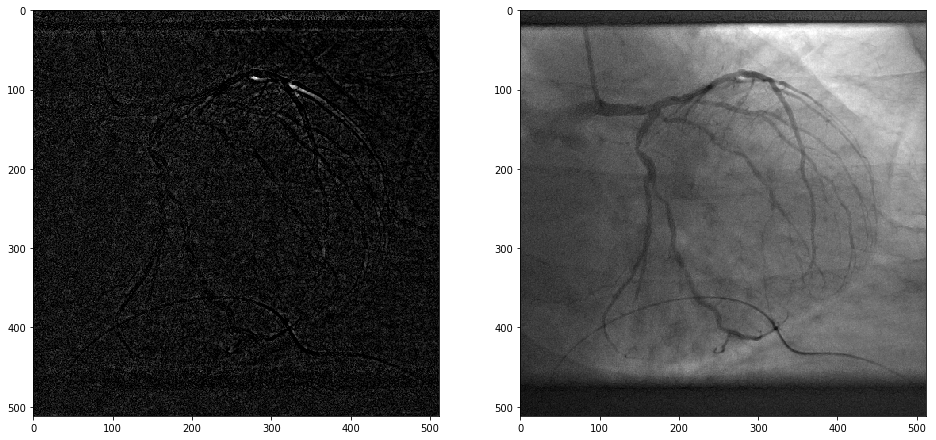

In [20]:
tophat = morphology.white_tophat(np.squeeze(img), selem=morphology.square(5))
fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
plt.imshow(np.squeeze(tophat), cmap='gray')
fig.add_subplot(122)
plt.imshow(np.squeeze(img), cmap='gray')

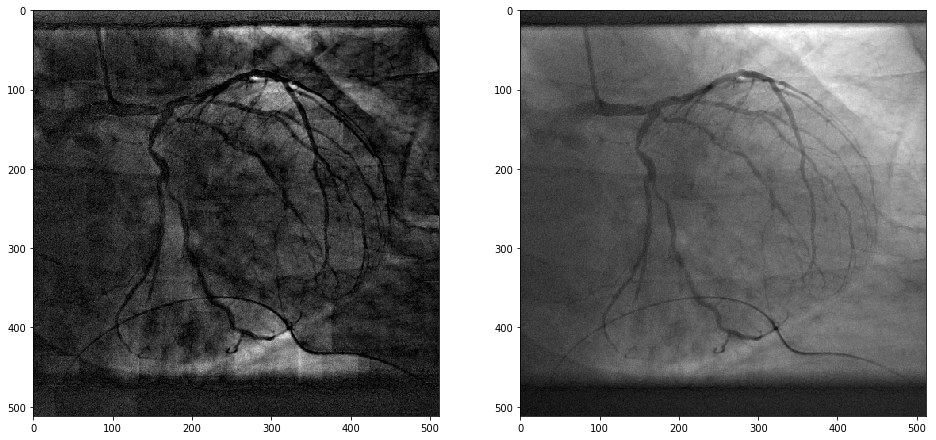

In [21]:
tophat = morphology.white_tophat(np.squeeze(img), selem=morphology.square(50))
fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
plt.imshow(np.squeeze(tophat), cmap='gray')
fig.add_subplot(122)
plt.imshow(np.squeeze(img), cmap='gray')

# Subtracting black-tophat from white-tophat to enhance contrast
- Remember 'B' for Black tophat == Bottom-hat; white-tophat == top-hat

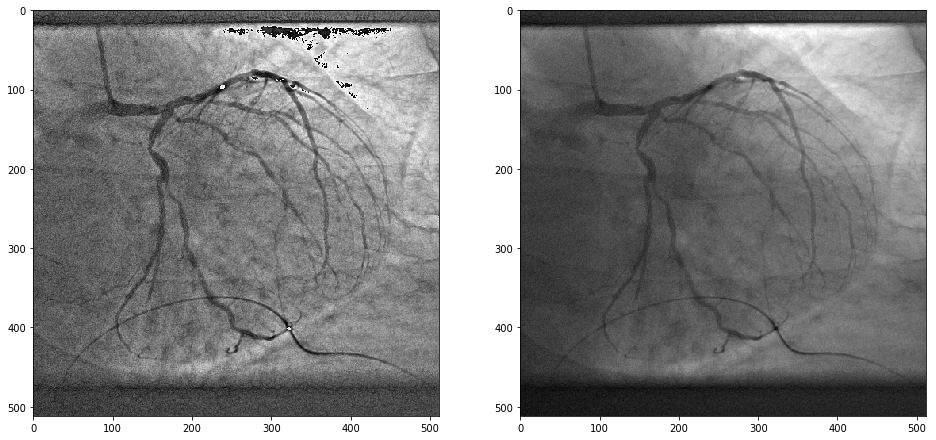

In [22]:
bottom_hat = morphology.black_tophat(np.squeeze(img), selem=morphology.square(20))
tophat = morphology.white_tophat(np.squeeze(img), selem=morphology.square(20))

newimg = img + tophat - bottom_hat

fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
plt.imshow(np.squeeze(newimg), cmap='gray')
fig.add_subplot(122)
plt.imshow(np.squeeze(img), cmap='gray')

# Segmentation of vessels in angiograms using CNNS
- Section 2.1: Contrast

- In white top-hat the areas in the image that have high gray scalevalues, i.e. bright areas, are tracked and intensified. In contrast, inblack top-hat the dark regions in the image are highlighted. Henceby applying Eq. (1), after the image is added by white top-hat andthe black top-hat is subtracted from the image, the contrast of theimage is increased.
- fen = f + fw − fb

- In multi scale top-hat transform, different scales are selectedfor structuring element Bi. 
- Using Eqs. (2) and (3) to correspondingblack and white top-hat maps are calculated for each scale.
- (2) fwi=f− ((fBi) ⊕ Bi) 
- (3)fbi= ((f⊕Bi)  Bi) − f 

- In Eqs. (2) and (3), Bi, f, fwiand fbidenote the structuring ele-ment of the ithscale, input image, 
the white and black top-hattransforms respectively. Also, ⊕,  are morphological dilation anderosion operators. 
- The dilation and erosion of f(x, y)by Bi(u, v)aredefined by Eqs. (4) and (5).

- (4) f⊕Bi =maxu,v (f (x−u, y−v) +Bi (u, v)) 
- (5) fBi =minu,v (f (x+u, y+v) −Bi (u, v))

In [23]:
elems = [3, 7, 11, 15, 19]
bottom_hats = np.array([morphology.black_tophat(np.squeeze(img), selem=morphology.square(elem)) for elem in elems])
tophats = np.array([morphology.white_tophat(np.squeeze(img), selem=morphology.square(elem)) for elem in elems])

In [24]:
bottom_hats.shape

(5, 512, 512)

### Keep the max values as the white-tophat, and the min values of the bottom-tophat

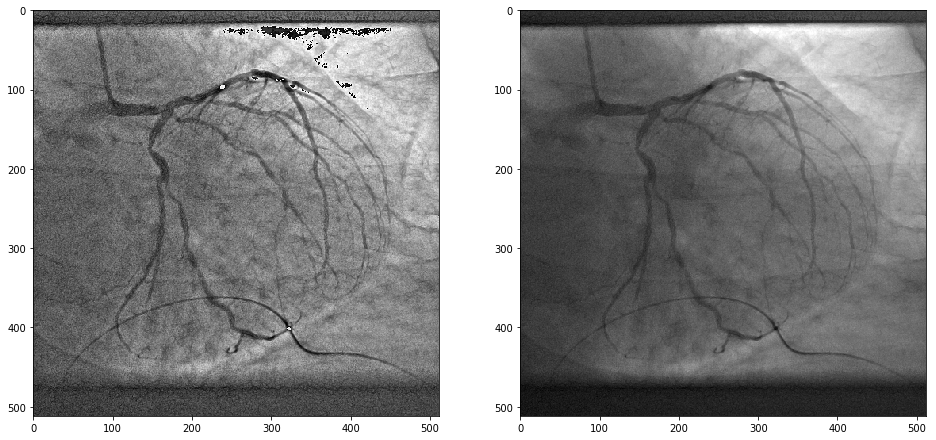

In [25]:
bottom_hat = bottom_hats.max(axis=0)
tophat = tophats.max(axis=0)

newimg = img + tophat - bottom_hat

fig = plt.figure(figsize=(16,8))
fig.add_subplot(121)
plt.imshow(np.squeeze(newimg), cmap='gray')
fig.add_subplot(122)
plt.imshow(np.squeeze(img), cmap='gray')

# Testing out other morphing operators (erosion, dilation, opening, closing)

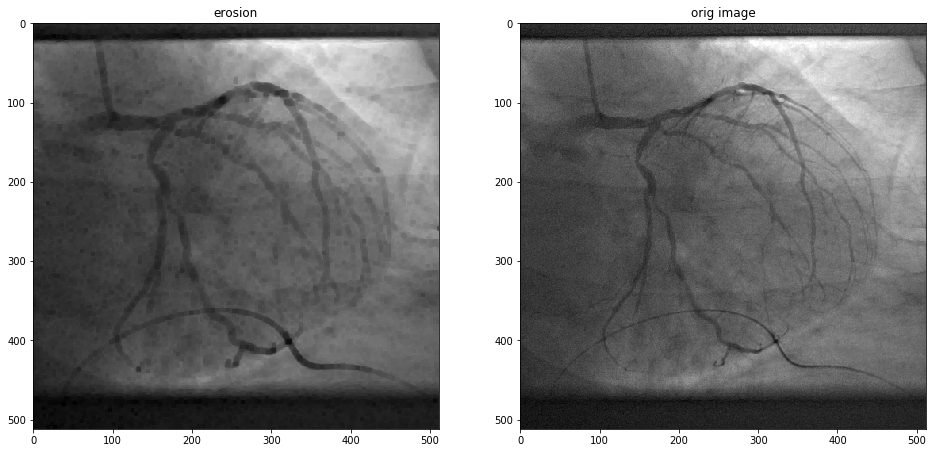

In [26]:
erosion = morphology.erosion(np.squeeze(img), selem=morphology.square(5))
fig = plt.figure(figsize=(16,8))
ax1 = fig.add_subplot(121)
ax1.set_title("erosion")
plt.imshow(np.squeeze(erosion), cmap='gray')
ax2 = fig.add_subplot(122)
ax2.set_title("orig image")
plt.imshow(np.squeeze(img), cmap='gray')

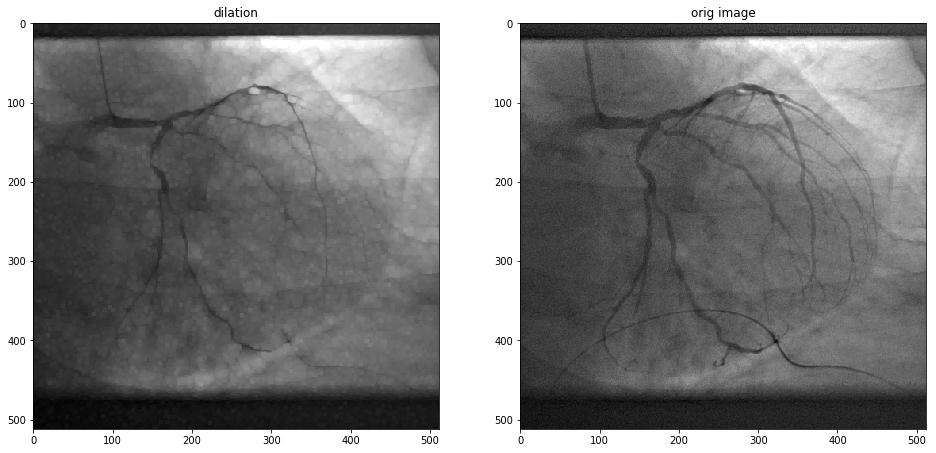

In [27]:
dilation = morphology.dilation(np.squeeze(img), selem=morphology.square(5))
fig = plt.figure(figsize=(16,8))
ax1 = fig.add_subplot(121)
ax1.set_title("dilation")
plt.imshow(np.squeeze(dilation), cmap='gray')
ax2 = fig.add_subplot(122)
ax2.set_title("orig image")
plt.imshow(np.squeeze(img), cmap='gray')

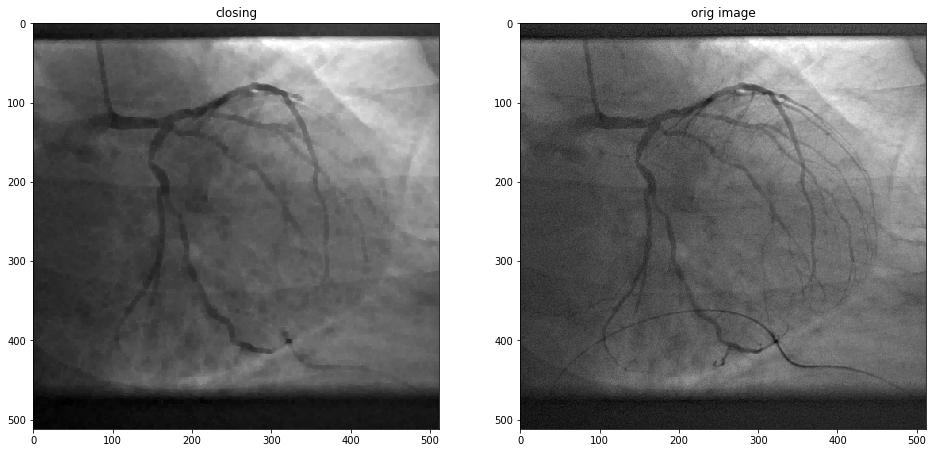

In [28]:
closing = morphology.closing(np.squeeze(img), selem=morphology.square(5))
fig = plt.figure(figsize=(16,8))
ax1 = fig.add_subplot(121)
ax1.set_title("closing")
plt.imshow(np.squeeze(closing), cmap='gray')
ax2 = fig.add_subplot(122)
ax2.set_title("orig image")
plt.imshow(np.squeeze(img), cmap='gray')

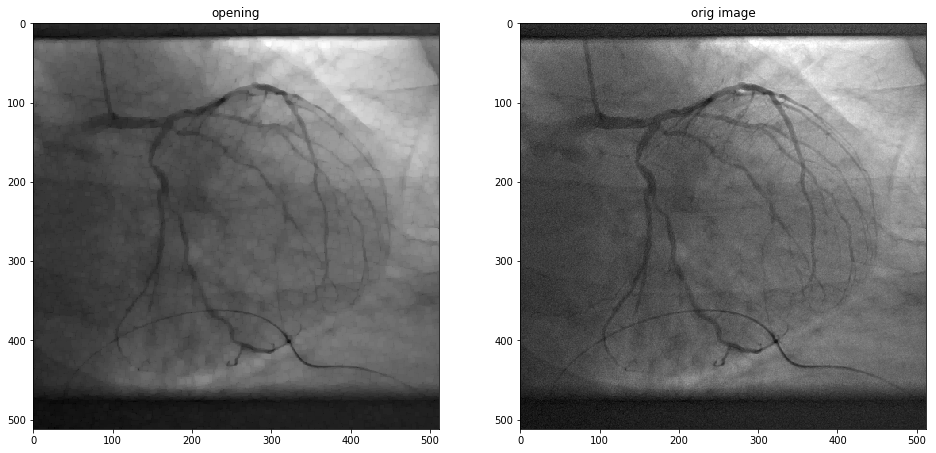

In [29]:
opening = morphology.opening(np.squeeze(img), selem=morphology.square(5))
fig = plt.figure(figsize=(16,8))
ax1 = fig.add_subplot(121)
ax1.set_title("opening")
plt.imshow(np.squeeze(opening), cmap='gray')
ax2 = fig.add_subplot(122)
ax2.set_title("orig image")
plt.imshow(np.squeeze(img), cmap='gray')

# Rotate

In [30]:
image = np.transpose(img, axes=(1,2,0))
image.shape[:2] 

(512, 512)

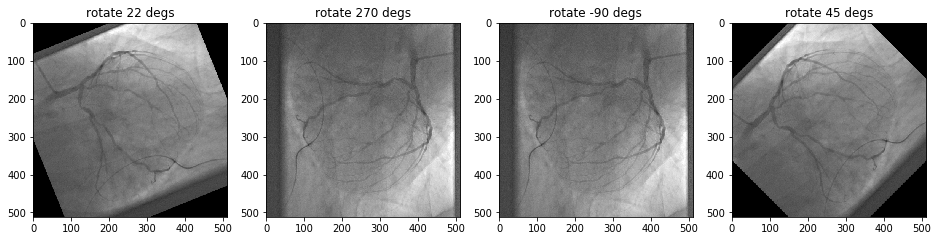

In [31]:
image = np.transpose(img, axes=(1,2,0))
rows,cols = image.shape[:2] 

fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(141)
ax1.set_title("rotate 22 degs")
#(col/2,rows/2) is the center of rotation for the image 
# M is the cordinates of the center 
M = cv2.getRotationMatrix2D((cols/2,rows/2),22,1) 
dst = cv2.warpAffine(image,M,(cols,rows)) 
plt.imshow(dst, cmap='gray')

ax2 = fig.add_subplot(142)
ax2.set_title("rotate 270 degs")
#(col/2,rows/2) is the center of rotation for the image 
# M is the cordinates of the center 
M = cv2.getRotationMatrix2D((cols/2,rows/2),270,1) 
dst = cv2.warpAffine(image,M,(cols,rows)) 
plt.imshow(dst, cmap='gray')

ax3 = fig.add_subplot(143)
ax3.set_title("rotate -90 degs")
#(col/2,rows/2) is the center of rotation for the image 
# M is the cordinates of the center 
M = cv2.getRotationMatrix2D((cols/2,rows/2),-90,1) 
dst = cv2.warpAffine(image,M,(cols,rows)) 
plt.imshow(dst, cmap='gray')

ax4 = fig.add_subplot(144)
ax4.set_title("rotate 45 degs")
#(col/2,rows/2) is the center of rotation for the image 
# M is the cordinates of the center 
M = cv2.getRotationMatrix2D((cols/2,rows/2),45,1) 
dst = cv2.warpAffine(image,M,(cols,rows)) 
plt.imshow(dst, cmap='gray')

# Flip

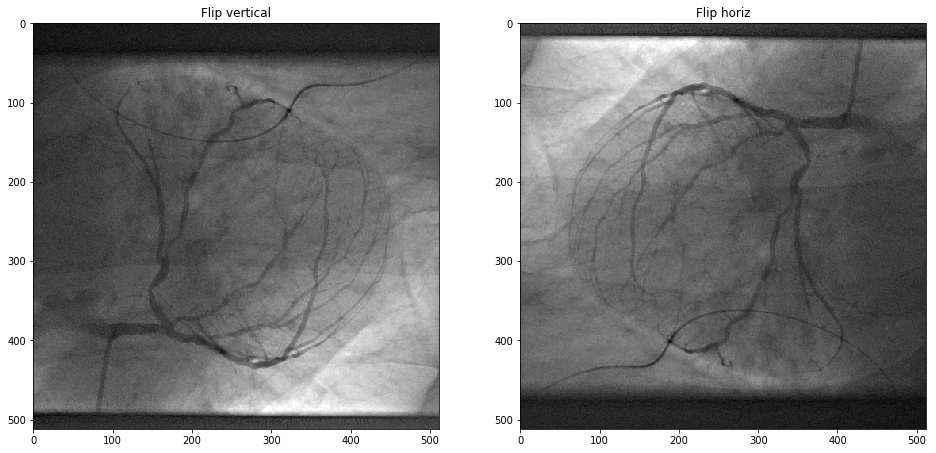

In [32]:
image = np.transpose(img, axes=(1,2,0))
rows,cols = image.shape[:2] 

fig = plt.figure(figsize=(16,8))

ax1 = fig.add_subplot(121)
ax1.set_title("Flip vertical")
dst = cv2.flip(image,0) 
plt.imshow(dst, cmap='gray')

ax2 = fig.add_subplot(122)
ax2.set_title("Flip horiz")
dst = cv2.flip(image,1)
plt.imshow(dst, cmap='gray')

# Noise

In [33]:
from skimage.util import random_noise

In [34]:
img.shape

(1, 512, 512)

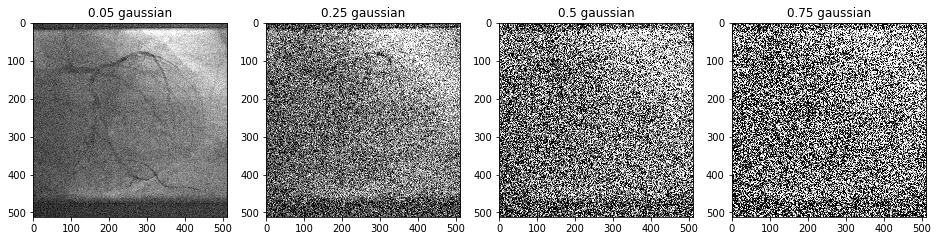

In [35]:
# random_noise() method will convert image in [0, 255] to [0, 1.0],
# inherently it use np.random.normal() to create normal distribution and adds the generated noised back to image
# modes are 'gaussian', 'localvar', 'poisson', 'salt', 'pepper', 's&p', and 'speckle'
# var stands for variance of the distribution. Used in 'gaussian' and 'speckle'.
# amount can be used for s&p
image = np.squeeze(img.astype(float)/255)

fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(141)
ax1.set_title("0.05 gaussian")
noise_img = random_noise(image, mode='gaussian', var=0.05**2)
noise_img = (255*noise_img).astype(np.uint8)
plt.imshow(noise_img, cmap='gray')

ax2 = fig.add_subplot(142)
ax2.set_title("0.25 gaussian")
noise_img = random_noise(image, mode='gaussian', var=0.25**2)
noise_img = (255*noise_img).astype(np.uint8)
plt.imshow(noise_img, cmap='gray')

ax3 = fig.add_subplot(143)
ax3.set_title("0.5 gaussian")
noise_img = random_noise(image, mode='gaussian', var=0.5**2)
noise_img = (255*noise_img).astype(np.uint8)
plt.imshow(noise_img, cmap='gray')

ax4 = fig.add_subplot(144)
ax4.set_title("0.75 gaussian")
noise_img = random_noise(image, mode='gaussian', var=0.75**2)
noise_img = (255*noise_img).astype(np.uint8)
plt.imshow(noise_img, cmap='gray')

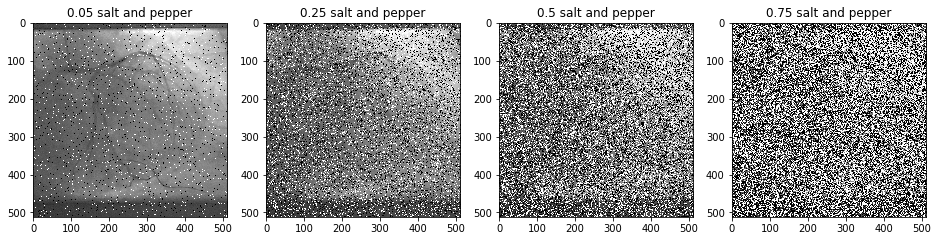

In [36]:
# random_noise() method will convert image in [0, 255] to [0, 1.0],
# inherently it use np.random.normal() to create normal distribution and adds the generated noised back to image
# modes are 'gaussian', 'localvar', 'poisson', 'salt', 'pepper', 's&p', and 'speckle'
# var stands for variance of the distribution. Used in 'gaussian' and 'speckle'.
# amount can be used for s&p
image = np.squeeze(img.astype(float)/255)

fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(141)
ax1.set_title("0.05 salt and pepper")
noise_img = random_noise(image, mode='s&p', amount=0.05)
noise_img = (255*noise_img).astype(np.uint8)
plt.imshow(noise_img, cmap='gray')

ax2 = fig.add_subplot(142)
ax2.set_title("0.25 salt and pepper")
noise_img = random_noise(image, mode='s&p', amount=0.25)
noise_img = (255*noise_img).astype(np.uint8)
plt.imshow(noise_img, cmap='gray')

ax3 = fig.add_subplot(143)
ax3.set_title("0.5 salt and pepper")
noise_img = random_noise(image, mode='s&p', amount=0.5)
noise_img = (255*noise_img).astype(np.uint8)
plt.imshow(noise_img, cmap='gray')

ax4 = fig.add_subplot(144)
ax4.set_title("0.75 salt and pepper")
noise_img = random_noise(image, mode='s&p', amount=0.75)
noise_img = (255*noise_img).astype(np.uint8)
plt.imshow(noise_img, cmap='gray')

# Translation

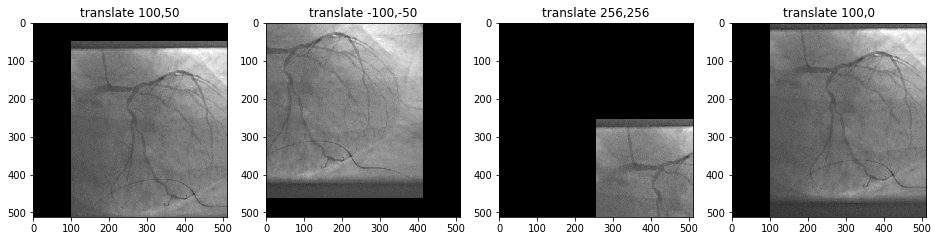

In [37]:
image = np.transpose(img, axes=(1,2,0))
rows,cols = image.shape[:2] 

fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(141)
ax1.set_title("translate 100,50")
#Translate 100,50
M = np.float32([[1,0,100],[0,1,50]])
dst = cv2.warpAffine(image,M,(cols,rows)) 
plt.imshow(dst, cmap='gray')

ax2 = fig.add_subplot(142)
ax2.set_title("translate -100,-50")
#Translate -100,-50
M = np.float32([[1,0,-100],[0,1,-50]])
dst = cv2.warpAffine(image,M,(cols,rows)) 
plt.imshow(dst, cmap='gray')

ax3 = fig.add_subplot(143)
ax3.set_title("translate 256,256")
#Translate 256,256
M = np.float32([[1,0,256],[0,1,256]])
dst = cv2.warpAffine(image,M,(cols,rows)) 
plt.imshow(dst, cmap='gray')

ax4 = fig.add_subplot(144)
ax4.set_title("translate 100,0")
#Translate 100,0
M = np.float32([[1,0,100],[0,1,0]])
dst = cv2.warpAffine(image,M,(cols,rows)) 
plt.imshow(dst, cmap='gray')

In [24]:
data2, filenames2 = load_train_test_images(cv=9, cv_max=10, stage=2)
        
#
#   Unpack Images from data; all in (n x c x h x w) format
#
train_x_imgs2 = data2["train_x_images"]
train_y_imgs2 = data2["train_y_images"]
test_x_imgs2 = data2["test_x_images"]
test_y_imgs2 = data2["test_y_images"]
train_filenames2  = filenames2["train_filenames"]
test_filenames2 = filenames2["test_filenames"]

In [4]:
img2 = train_x_imgs2[0]

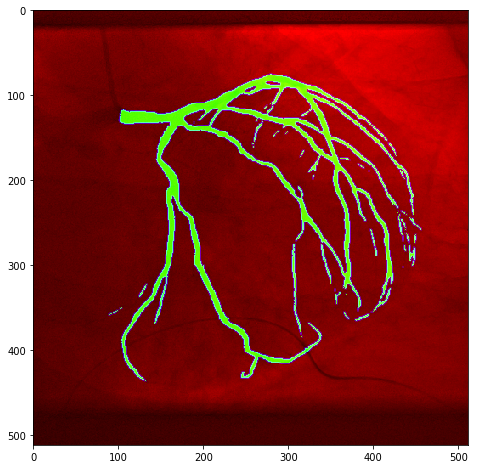

In [5]:
plt.figure(figsize=(8,8))
plt.imshow(np.transpose(img2, axes=(1,2,0)))

In [6]:
l1, l2, l3 = img2[0], img2[1], img2[2]

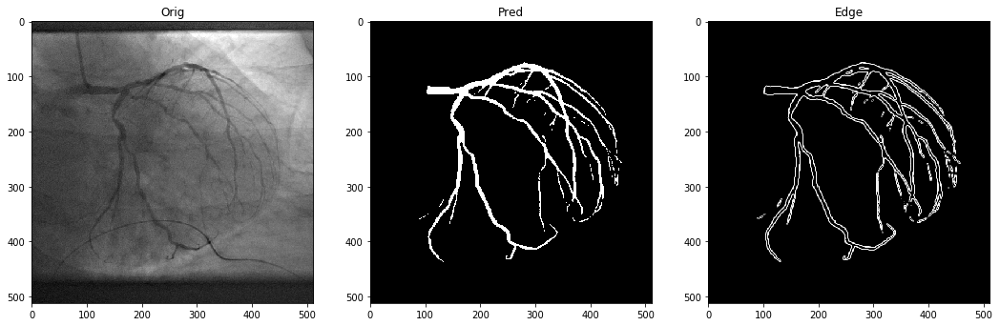

In [7]:
fig = plt.figure(figsize=(18,6))

ax1 = fig.add_subplot(131)
ax1.set_title("Orig")
plt.imshow(np.squeeze(l1), cmap='gray')

ax2 = fig.add_subplot(132)
ax2.set_title("Pred")
plt.imshow(np.squeeze(l2), cmap='gray')

ax3 = fig.add_subplot(133)
ax3.set_title("Edge")
plt.imshow(np.squeeze(l3), cmap='gray')

In [8]:
maxi = np.maximum(l1,l2)
maxi.shape

(512, 512)

# Maximum ( orig, pred )

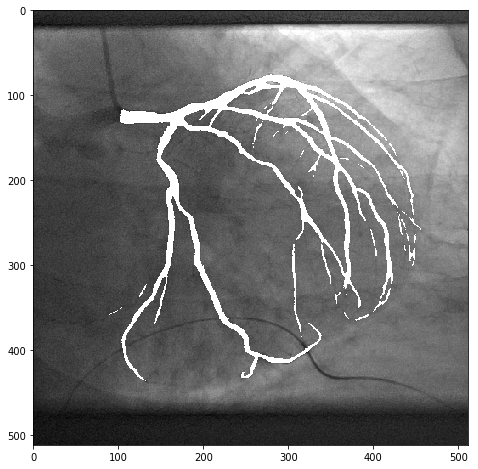

In [9]:
plt.figure(figsize=(8,8))
plt.imshow(np.squeeze(maxi), cmap='gray')

# Edge map of prediction vs edge map of maximum(prediction, orig)

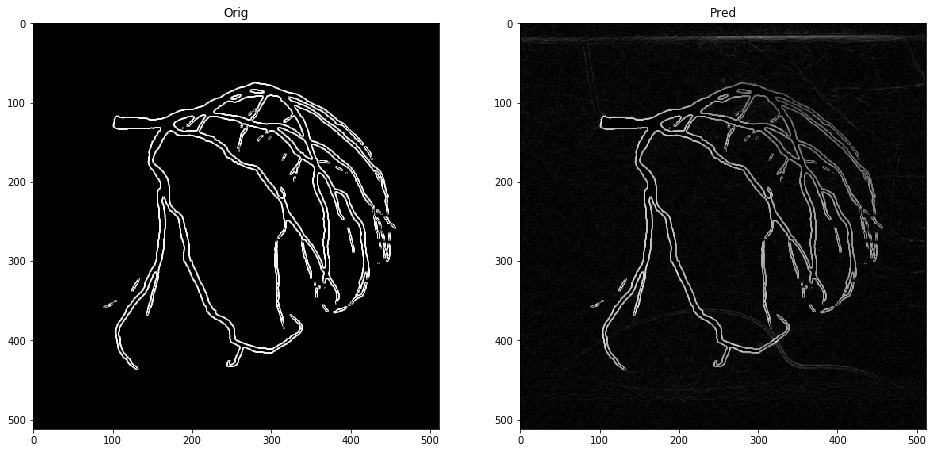

In [13]:
edge = filters.prewitt(np.squeeze(maxi.astype(np.uint8)))*255
fig = plt.figure(figsize=(16,8))

ax1 = fig.add_subplot(121)
ax1.set_title("Orig")
plt.imshow(np.squeeze(l3), cmap='gray')

ax2 = fig.add_subplot(122)
ax2.set_title("Pred")
plt.imshow(np.squeeze(edge), cmap='gray')

# Let's Look into a test image edge maps

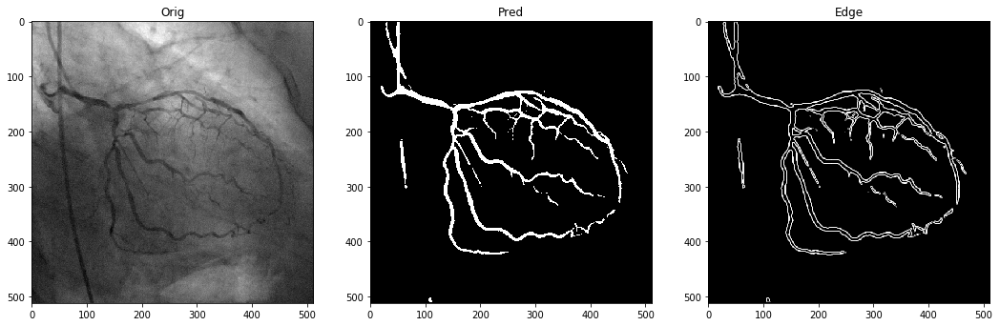

In [29]:
img2t = test_x_imgs2[5]
l1t, l2t, l3t = img2t[0], img2t[1], img2t[2]
fig = plt.figure(figsize=(18,6))

ax1 = fig.add_subplot(131)
ax1.set_title("Orig")
plt.imshow(np.squeeze(l1t), cmap='gray')

ax2 = fig.add_subplot(132)
ax2.set_title("Pred")
plt.imshow(np.squeeze(l2t), cmap='gray')

ax3 = fig.add_subplot(133)
ax3.set_title("Edge")
plt.imshow(np.squeeze(l3t), cmap='gray')

# Maximum ( orig, pred )

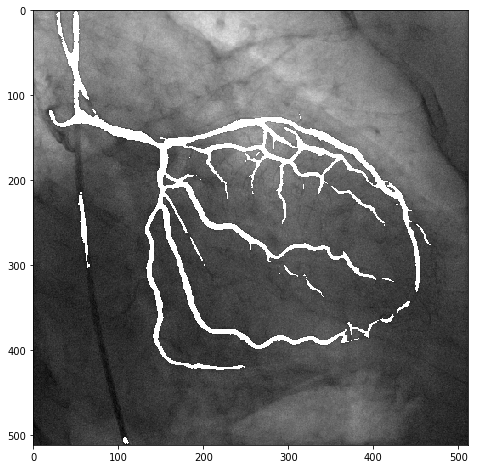

In [30]:
maxit = np.maximum(l1t,l2t)
maxit.shape
plt.figure(figsize=(8,8))
plt.imshow(np.squeeze(maxit), cmap='gray')

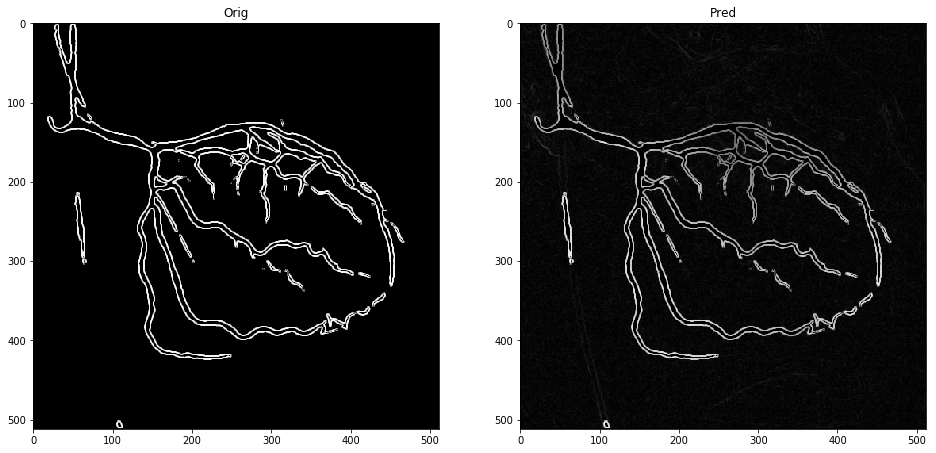

In [31]:
edget = filters.prewitt(np.squeeze(maxit.astype(np.uint8)))*255
fig = plt.figure(figsize=(16,8))

ax1 = fig.add_subplot(121)
ax1.set_title("Orig")
plt.imshow(np.squeeze(l3t), cmap='gray')

ax2 = fig.add_subplot(122)
ax2.set_title("Pred")
plt.imshow(np.squeeze(edget), cmap='gray')

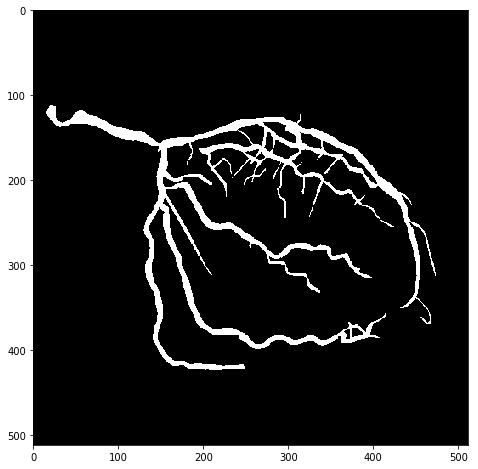

In [32]:
plt.figure(figsize=(8,8))
plt.imshow(np.squeeze(test_y_imgs2[5]), cmap='gray')

# Augment_imageset

In [42]:
def augment_imageset(input_img, label_img, probability_threshold=0.2, flip=True, rotate=True, translate=True, tophat=True, make_noise=True):
    """
    Perform morphological transformations and other data augmentation methods on an input image and label image.
    Decide whether to perform each operation randomly based on the probability_threshold
    Operations:
    - Horizontal and Vertical flips (one or the other)
    - Rotations
    - Translations 
    - Top and bottom hat transforms (one or the other)
    - Random Gaussian and Salt & Pepper Noise (one or the other)
    Input:
    - input_img - of shape (num_channels, height, width); ***data should be in integer 0-255 format***
    - label_img - of shape (num_channels, height, width); ***data should be in integer 0-255 format***
    - probability_threshold - 0.0 to 1.0 (0% to 100%)
    """
    # Copy Arrays so that we don't run into any array shared storage issues
    x_img = input_img.copy()
    y_img = label_img.copy()
    
    # Flips
    if flip and np.random.rand() <= probability_threshold:
        # Vertical flip is axis 0, Horizontal flip is axis 1
        flip_axis = 0 if np.random.rand() <= 0.5 else 1
        print("flip axis %d"%flip_axis)
        for index, img in enumerate(x_img):
            x_img[index] = cv2.flip(img.copy(), flip_axis)
        for index, lbl in enumerate(y_img):
            y_img[index] = cv2.flip(lbl.copy(), flip_axis)
    
    # Rotations - important to put this before translate
    if rotate and np.random.rand() <= probability_threshold:
        # Rotate from -360 to +360 degrees
        rotation = np.random.randint(-360,360)
        print("rotate %d degrees" % rotation)
        rows,cols = image.shape[:2] 

        for index, img in enumerate(x_img):
            #(col/2,rows/2) is the center of rotation for the image 
            # M is transformation matrix (computer graphics concept)
            M = cv2.getRotationMatrix2D((cols/2,rows/2),rotation,1) 
            x_img[index] = cv2.warpAffine(img.copy(),M,(cols,rows))         
        for index, lbl in enumerate(y_img):
            M = cv2.getRotationMatrix2D((cols/2,rows/2),rotation,1) 
            y_img[index] = cv2.warpAffine(lbl.copy(),M,(cols,rows))  
        
    # Translations
    if translate and np.random.rand() <= probability_threshold:
        # Translate from -(1/4) to +(1/4) of image height/width
        translation_x = np.random.randint(int(- x_img.shape[-1] / 4), int(x_img.shape[-1] / 4))
        translation_y = np.random.randint(int(- x_img.shape[-2] / 4), int(x_img.shape[-2] / 4))
        print("translate [%d, %d] pixels" % (translation_x, translation_y))
        
        for index, img in enumerate(x_img):
            # M is transformation matrix (computer graphics concept)
            M = np.float32([[1,0,translation_x],[0,1,translation_y]]) 
            x_img[index] = cv2.warpAffine(img.copy(),M,(cols,rows))         
        for index, lbl in enumerate(y_img):
            M = np.float32([[1,0,translation_x],[0,1,translation_y]]) 
            y_img[index] = cv2.warpAffine(lbl.copy(),M,(cols,rows))  
        
    # Tophat transforms
    if tophat and np.random.rand() <= probability_threshold:
        # tophat (image opening) is black_tophat; bottomhat (image closing) is white_tophat
        # https://www.youtube.com/watch?v=P2vAhqGgV44
        # Size 25 square for structuring element visually looks like a good choice for this type of data
        xform = morphology.black_tophat if np.random.rand() <= 0.5 else morphology.white_tophat
        print("Tophat transform: %s" % str(xform))
        x_img[0] = xform(img, selem=morphology.square(25))

    # Make some noise
    if make_noise and np.random.rand() <= probability_threshold:
        # random_noise() uses scale [0, 1.0], will need to multiply to get it to [0, 255]
        # inherently it use np.random.normal() to create normal distribution and adds the generated noised back to image
        # modes are 'gaussian', 'localvar', 'poisson', 'salt', 'pepper', 's&p', and 'speckle'
        # var stands for variance of the distribution. Used in 'gaussian' and 'speckle'. amount can be used for s&p
        # variance / amount will be up to 0.25
        noise = np.random.randint(0,25) / 100.0
        mode = "s&p" if np.random.rand() <= 0.5 else "gaussian"
        print("Adding %.02f %s noise" % (noise, mode))
        
        noise_img = None
        if mode == "gaussian":
            noise_img = random_noise(x_img[0], mode=mode, var=noise)  
        elif mode == "s&p":
            noise_img = random_noise(image, mode=mode, amount=0.5)
        noise_img = (255*noise_img).astype(np.uint8)
        
    return x_img, y_img

image shape: (1, 512, 512)
flip axis 0
rotate -328 degrees
translate [22, -67] pixels
Tophat transform: <function white_tophat at 0x000001420DBD9F28>
Adding 0.02 s&p noise


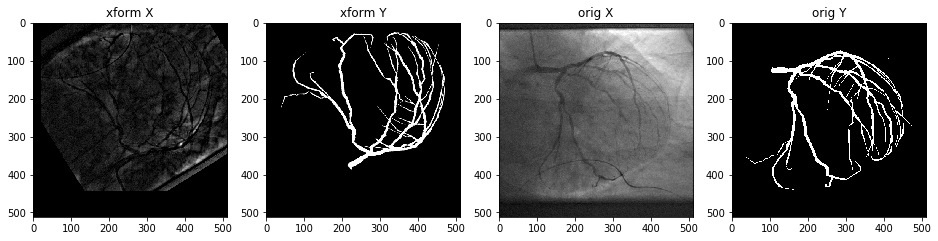

In [43]:
img = train_x_imgs[0].copy()
lbl = train_y_imgs[0].copy()
print("image shape: %s" % str(img.shape))
img_aug, lbl_aug = augment_imageset(img,lbl,probability_threshold=1.0)

fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(141)
ax1.set_title("xform X")
plt.imshow(np.squeeze(img_aug), cmap='gray')

ax2 = fig.add_subplot(142)
ax2.set_title("xform Y")
plt.imshow(np.squeeze(lbl_aug), cmap='gray')

ax3 = fig.add_subplot(143)
ax3.set_title("orig X")
plt.imshow(np.squeeze(img), cmap='gray')

ax4 = fig.add_subplot(144)
ax4.set_title("orig Y")
plt.imshow(np.squeeze(lbl), cmap='gray')

image shape: (1, 512, 512)
flip axis 0
rotate 224 degrees
translate [39, 111] pixels
Adding 0.06 s&p noise


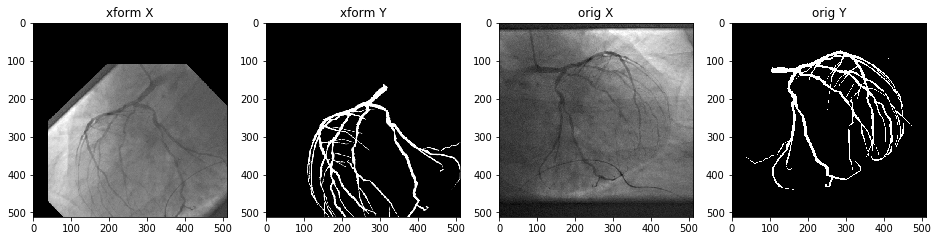

In [44]:
img = train_x_imgs[0].copy()
lbl = train_y_imgs[0].copy()
print("image shape: %s" % str(img.shape))
img_aug, lbl_aug = augment_imageset(img,lbl,probability_threshold=1.0, tophat=False)

fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(141)
ax1.set_title("xform X")
plt.imshow(np.squeeze(img_aug), cmap='gray')

ax2 = fig.add_subplot(142)
ax2.set_title("xform Y")
plt.imshow(np.squeeze(lbl_aug), cmap='gray')

ax3 = fig.add_subplot(143)
ax3.set_title("orig X")
plt.imshow(np.squeeze(img), cmap='gray')

ax4 = fig.add_subplot(144)
ax4.set_title("orig Y")
plt.imshow(np.squeeze(lbl), cmap='gray')

flip axis 1
rotate -281 degrees
translate [38, 74] pixels
Tophat transform: <function white_tophat at 0x000001420DBD9F28>
Adding 0.10 s&p noise


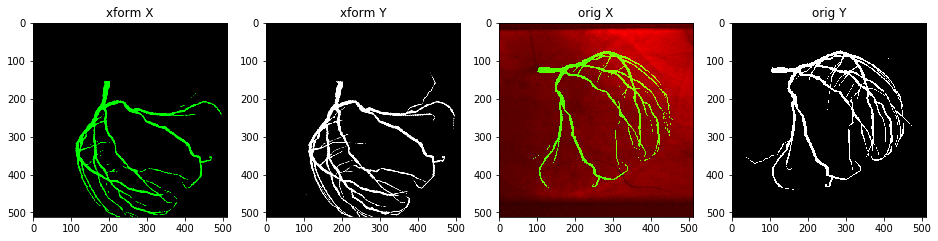

In [45]:
img = train_x_imgs2[0].copy()
lbl = train_y_imgs2[0].copy()
img_aug, lbl_aug = augment_imageset(img,lbl,probability_threshold=1.0)

fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(141)
ax1.set_title("xform X")
plt.imshow(np.transpose(img_aug, axes=(1,2,0)))

ax2 = fig.add_subplot(142)
ax2.set_title("xform Y")
plt.imshow(np.squeeze(lbl_aug), cmap='gray')

ax3 = fig.add_subplot(143)
ax3.set_title("orig X")
plt.imshow(np.transpose(img, axes=(1,2,0)))

ax4 = fig.add_subplot(144)
ax4.set_title("orig Y")
plt.imshow(np.squeeze(lbl), cmap='gray')

flip axis 0
rotate 22 degrees
translate [-15, 117] pixels
Adding 0.22 gaussian noise


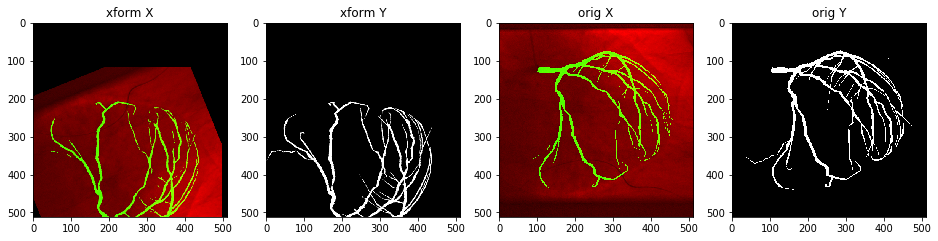

In [46]:
img = train_x_imgs2[0].copy()
lbl = train_y_imgs2[0].copy()
img_aug, lbl_aug = augment_imageset(img,lbl,probability_threshold=1.0, tophat=False)

fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(141)
ax1.set_title("xform X")
plt.imshow(np.transpose(img_aug, axes=(1,2,0)))

ax2 = fig.add_subplot(142)
ax2.set_title("xform Y")
plt.imshow(np.squeeze(lbl_aug), cmap='gray')

ax3 = fig.add_subplot(143)
ax3.set_title("orig X")
plt.imshow(np.transpose(img, axes=(1,2,0)))

ax4 = fig.add_subplot(144)
ax4.set_title("orig Y")
plt.imshow(np.squeeze(lbl), cmap='gray')

In [47]:
np.random.seed()
np.random.rand()

0.226351411083193

In [48]:
np.random.seed(42)
print(np.random.rand())
np.random.seed()
print(np.random.rand())

0.3745401188473625
0.5769913866584522


# Stitch images

In [49]:
import cv2

In [50]:
def stitch_imgs(img, sketch, height=256, width=256):
    """
    given input img and sketch, output an aligned imageset of [img|sketch]
    img and sketch should be of shape (c x h x w), as fetched from cv2.imread()
    """
    # get hw dims of img and sketch
    img_h, img_w, img_c = img.shape[0], img.shape[1], img.shape[2]
    sketch_h, sketch_w, sketch_c = sketch.shape[0], sketch.shape[1], sketch.shape[2]
    
    # get axis height and width scales in relation to target height and width
    img_scaler_h = height / img_h
    img_scaler_w = width / img_w
    sketch_scaler_h = height / sketch_h
    sketch_scaler_w = width / sketch_w
    
    # scale image based on smallest scaling ratio (ensures no whitespace when we go to crop)
    img_scaler_axis = 0 if img_scaler_h > img_scaler_w else 1 # scaler axis is axis that 
    img_scaler = img_scaler_h if img_scaler_axis == 0 else img_scaler_w
    new_img = cv2.resize(img, (int(img_w * img_scaler), int(img_h * img_scaler)))
    #   put the singular dimension back for grayscale images
    if img_c == 1:
        new_img = np.expand_dims(new_img, -1)
            
    #   crop (first "if" is to resize width, since height was scaler_axis; else is to resize height)
    if img_scaler_axis == 1:
        middle = int(new_img.shape[0]/2)
        start = middle - int(height/2)
        new_img = new_img[start:start+height, :, :]
    else:
        middle = int(new_img.shape[1]/2)
        start = middle - int(width/2)
        new_img = new_img[:, start:start+width, :]
        
    # scale sketch based on smallest scaling ratio (ensures no whitespace when we go to crop)
    sketch_scaler_axis = 0 if sketch_scaler_h > sketch_scaler_w else 1 # scaler axis is axis that 
    sketch_scaler = sketch_scaler_h if sketch_scaler_axis == 0 else sketch_scaler_w
    new_sketch = cv2.resize(sketch, (int(sketch_w * sketch_scaler), int(sketch_h * sketch_scaler)))
    #   put the singular dimension back for grayscale sketches
    if sketch_c == 1:
        new_sketch = np.expand_dims(new_sketch, 0)
            
    #   crop (first "if" is for height, elif for width)
    if sketch_scaler_axis == 1:
        middle = int(new_sketch.shape[0]/2)
        start = middle - int(height/2)
        new_sketch = new_sketch[start:start+height, :, :]
    else:
        middle = int(new_sketch.shape[1]/2)
        start = middle - int(width/2)
        new_sketch = new_sketch[:, start:start+width, :]   

    # stitch images together
    print("new img shape: %s" % str(new_img.shape))
    print("new sketch shape: %s" % str(new_sketch.shape))
    return np.hstack([new_img, new_sketch])

In [51]:
img = np.random.rand(543,434,3)
sketch = np.random.rand(243,434,3)

In [52]:
new = stitch_imgs(img, sketch)

new img shape: (256, 256, 3)
new sketch shape: (256, 256, 3)
